In [1]:
# data manipulation:
import pandas as pd
import numpy as np

# stats:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from scipy import stats
import math

# plotting and images:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import Image

# import warnings
# warnings.filterwarnings("ignore")

---
### Import data (tables):

In [2]:
# user event logs (a.k.a evidence):
events_df = pd.read_csv('data/collector_log.csv')
events_df.head(5)

,id,created,user_id,content_id,event,session_id
0,1,2022-04-26 10:44:50-04,400003,4501244,details,794773
1,2,2022-04-26 10:44:50-04,400003,3521164,moreDetails,794773
2,3,2022-04-26 10:44:50-04,400005,3640424,details,441002
3,4,2022-04-26 10:44:50-04,400001,2823054,moreDetails,885440
4,5,2022-04-26 10:44:50-04,400005,3553976,genreView,441003


In [3]:
# item details (a.k.a content):
movies_df = pd.read_csv('data/moviegeeks_movie.csv')
movies_df.head(5)

,movie_id,title,year
0,8,Edison Kinetoscopic Record of a Sneeze,1894
1,10,La sortie des usines Lumière,1895
2,12,The Arrival of a Train,1896
3,25,The Oxford and Cambridge University Boat Race,1895
4,91,Le manoir du diable,1896


#### Join tables to get full movie details:

In [4]:
merged_df = pd.merge(left=events_df, right=movies_df, how='inner', left_on='content_id', right_on='movie_id')
merged_df.head(5)
# merged_df['content_id'].nunique()

,id,created,user_id,content_id,event,session_id,movie_id,title,year
0,1,2022-04-26 10:44:50-04,400003,4501244,details,794773,4501244,Why Him?,2016
1,93,2022-04-26 10:44:50-04,400003,4501244,buy,794776,4501244,Why Him?,2016
2,104,2022-04-26 10:44:50-04,400003,4501244,moreDetails,794777,4501244,Why Him?,2016
3,226,2022-04-26 10:44:50-04,400001,4501244,addToList,885442,4501244,Why Him?,2016
4,227,2022-04-26 10:44:50-04,400001,4501244,details,885442,4501244,Why Him?,2016


---
### Plot dataframe to visualize content popularity and trends:

In [5]:
merged_df.pivot_table(index='title', columns='event', values='content_id', aggfunc='count').sort_values(by='buy', ascending=False)

event,addToList,buy,details,genreView,moreDetails
title,,,,,
Be Somebody,186,30,866,276,382
Logan,173,27,764,234,327
Ride Along 2,189,23,825,269,408
La La Land,168,19,849,288,427
Now You See Me 2,161,17,897,294,420
...,...,...,...,...,...
Spider-Man: Homecoming,76,4,384,135,189
Deadpool,79,3,400,138,189
Independence Day: Resurgence,70,3,424,129,178


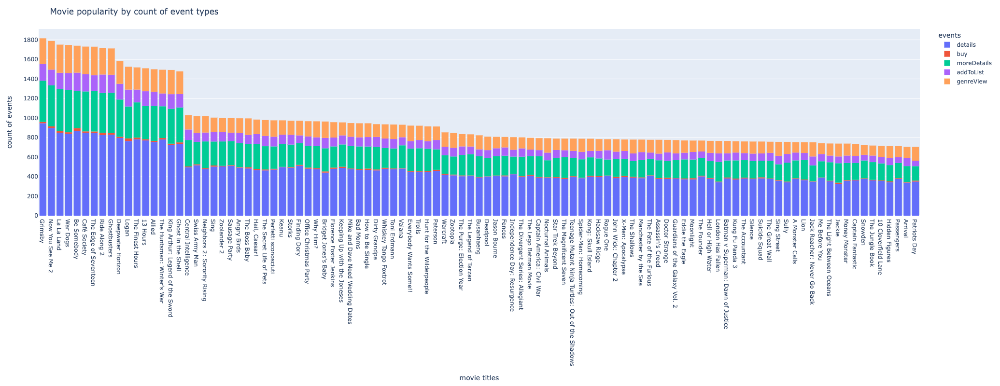

In [6]:
# plot:
pop_fig = px.histogram(merged_df, x='title', y='session_id', color='event', histfunc='count').update_xaxes(categoryorder="total descending")

# plot options:
pop_fig.update_layout(
                    title="Movie popularity by count of event types",
                    xaxis_title="movie titles",
                    yaxis_title="count of events",
                    legend_title="events",
                    width=1900,
                    height=800,
                    )

---
### Get dataframe of event counts by user id

In [7]:
user_content_events = merged_df.groupby(['user_id', 'title'])['event'].value_counts().to_frame().unstack().reset_index()
user_content_events
# user_content_events.reset_index()

user_id                   title     event                         \
event                                 addToList  buy details genreView   
0      400001    10 Cloverfield Lane       14.0  2.0    59.0      16.0   
1      400001               13 Hours       14.0  1.0   105.0      30.0   
2      400001        A Monster Calls       12.0  1.0    65.0      16.0   
3      400001                 Allied       21.0  1.0   107.0      29.0   
4      400001            Angry Birds       20.0  1.0    94.0      35.0   
..        ...                     ...       ...  ...     ...       ...   
494    400006  Whiskey Tango Foxtrot       56.0  5.0   198.0      59.0   
495    400006               Why Him?       39.0  5.0   181.0      56.0   
496    400006      X-Men: Apocalypse        NaN  NaN     3.0       2.0   
497    400006            Zoolander 2       35.0  3.0   203.0      72.0   
498    400006               Zootopia        NaN  NaN     2.0       NaN   

                   
event moreDetails  
0            29.0  
1            57.0  
2            31.0  
3            51.0  
4            52.0  
..            ...  
494          95.0  
495          88.0  
496           1.0  
497         111.0  
498           4.0  

[499 rows x 7 columns]

In [8]:
# get user_id and title by dropping level 1:
a = merged_df.groupby(['user_id', 'title'])['event'].value_counts().to_frame().unstack().reset_index()
a.columns = a.columns.droplevel(level=1)
a = a.iloc[:,0:2]
a.head(5)

,user_id,title
0,400001,10 Cloverfield Lane
1,400001,13 Hours
2,400001,A Monster Calls
3,400001,Allied
4,400001,Angry Birds


In [9]:
# get event types by dropping level 0:
b = merged_df.groupby(['user_id', 'title'])['event'].value_counts().to_frame().unstack().reset_index()
b.columns = b.columns.droplevel(level=0)
b = b.iloc[:,-5:]
b

event,addToList,buy,details,genreView,moreDetails
0,14.0,2.0,59.0,16.0,29.0
1,14.0,1.0,105.0,30.0,57.0
2,12.0,1.0,65.0,16.0,31.0
3,21.0,1.0,107.0,29.0,51.0
4,20.0,1.0,94.0,35.0,52.0
...,...,...,...,...,...
494,56.0,5.0,198.0,59.0,95.0
495,39.0,5.0,181.0,56.0,88.0
496,NaN,NaN,3.0,2.0,1.0
497,35.0,3.0,203.0,72.0,111.0


In [113]:
# concat both frames and drop unnecessary events:
user_content_events = pd.concat([a, b], axis=1)
user_content_events = user_content_events.drop(['addToList', 'genreView'], axis=1)
# user_content_events['moreDetails'] = 0   # this is to replicate a bug in the repo's code
user_content_events.head(5)

,user_id,title,buy,details,moreDetails
0,400001,10 Cloverfield Lane,2.0,59.0,29.0
1,400001,13 Hours,1.0,105.0,57.0
2,400001,A Monster Calls,1.0,65.0,31.0
3,400001,Allied,1.0,107.0,51.0
4,400001,Angry Birds,1.0,94.0,52.0


---
### Define function to calculate ratings based on number and type of events:

In [114]:
def get_implicit_rating(df):
    # obtain size of df:
    n_rows = len(df)

    # buy = 100, more_details = 50, details = 15... see page 92 of "Practical Recommender Systems"
    weights = np.array([100, 15, 50]*n_rows).reshape(n_rows, -3)
        
    # get events from input df:
    events_arr = np.array(df[['buy', 'details', 'moreDetails']].fillna(0))

    # calculate score:
    scores_raw = np.sum(weights*events_arr, axis=1)
    
    # calculate scaled scores (scale: 1-10):
    # NOTE: this needs to be done by grouping per user (because the max rating for each user is needed)
    df['implicit_rating'] = scores_raw
    scores_scaled = df.groupby('user_id')['implicit_rating'].apply(lambda x: 10*x/max(x)).round(2)
    
    return scores_scaled

In [116]:
user_content_events['implicit_rating'] = get_implicit_rating(user_content_events)
user_content_events.head(5)

,user_id,title,buy,details,moreDetails,implicit_rating
0,400001,10 Cloverfield Lane,2.0,59.0,29.0,3.29
1,400001,13 Hours,1.0,105.0,57.0,5.87
2,400001,A Monster Calls,1.0,65.0,31.0,3.40
3,400001,Allied,1.0,107.0,51.0,5.52
4,400001,Angry Birds,1.0,94.0,52.0,5.33


---
### Define function to create user-content events dataframe (to pass into the implicit rating calculator function):

In [117]:
def get_user_content_event_counts(events_df, content_df):
    # join tables to get full details:
    merged_df = pd.merge(left=events_df, right=content_df, how='inner', left_on='content_id', right_on='movie_id')
    
    # group by user, item (title), and event, and get the count for each event.    
    # get user_id and title by dropping level 1:
    a = merged_df.groupby(['user_id', 'title'])['event'].value_counts().to_frame().unstack().reset_index()
    a.columns = a.columns.droplevel(level=1)
    a = a.iloc[:,0:2]
    
    # get event types by dropping level 0:
    b = merged_df.groupby(['user_id', 'title'])['event'].value_counts().to_frame().unstack().reset_index()
    b.columns = b.columns.droplevel(level=0)
    b = b.iloc[:,-5:]
    
    # concat both frames and drop unnecessary events:
    user_content_events = pd.concat([a, b], axis=1)
    user_content_events = user_content_events.drop(['addToList', 'genreView'], axis=1)
    
    return user_content_events

In [119]:
get_user_content_event_counts(events_df, movies_df).head(5)

,user_id,title,buy,details,moreDetails
0,400001,10 Cloverfield Lane,2.0,59.0,29.0
1,400001,13 Hours,1.0,105.0,57.0
2,400001,A Monster Calls,1.0,65.0,31.0
3,400001,Allied,1.0,107.0,51.0
4,400001,Angry Birds,1.0,94.0,52.0
